# 10. Morphological Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Erosion](#erosion)
3. [Dilation](#dilation)
4. [Opening](#opening)
5. [Closing](#closing)
6. [Morphological Gradient](#gradient)
7. [Morphological Hats](#hats)
   1. [Top or White Hat](#top)
   1. [Black Hat](#black)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from skimage import color

from google.colab.patches import cv2_imshow

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [3]:
img = cv2.imread("/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg")
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg",0)

(836, 1254, 3) (836, 1254, 3) (836, 1254)


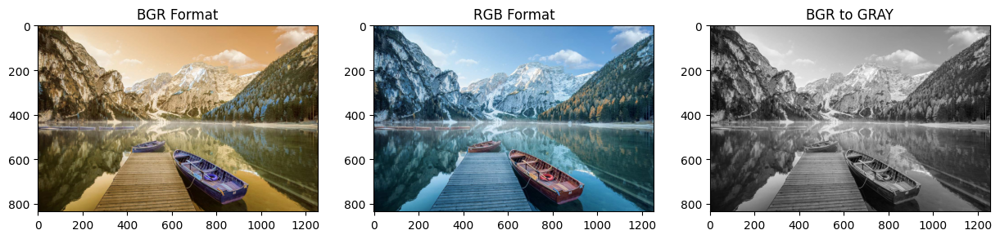

In [4]:
#function to see image
def imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3):
    print(img.shape,img1.shape,img2.shape)
    fig = plt.figure(figsize=(15,8))
    #adds a subplot at 1st position
    fig.add_subplot(rows,columns,1)
    plt.title('BGR Format')
    plt.imshow(img)

    #adds a subplot at 2nd position
    fig.add_subplot(rows,columns,2)
    plt.title('RGB Format')
    plt.imshow(img1)

    #adds a subplot at 3rd position
    fig.add_subplot(rows,columns, 3)
    plt.title('BGR to GRAY')
    plt.imshow(img2,cmap="gray")
    plt.show()

imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3)

## Erosion <a class="anchor" id="erosion" ></a>

Erosin primarily involves eroding(thinning) outer surface(foreground) of image
- Tt is suggested to have foreground as white

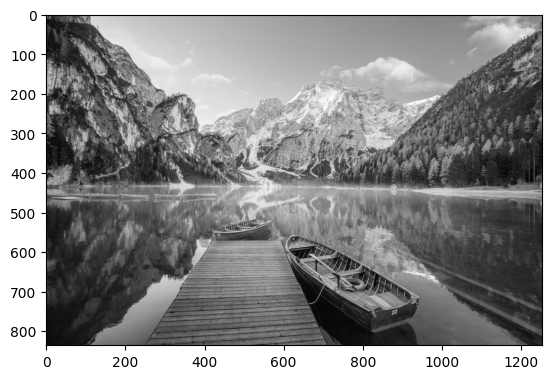

In [5]:
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

Eroding boundy of image upto 3 level

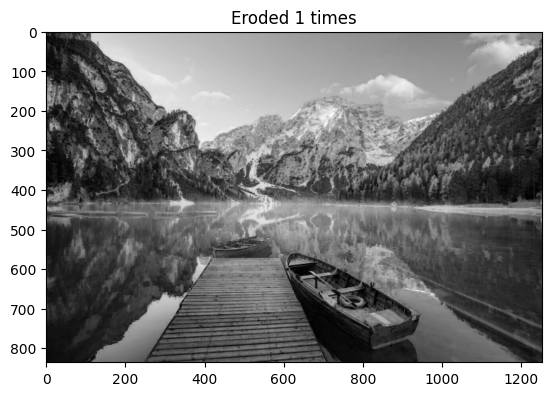

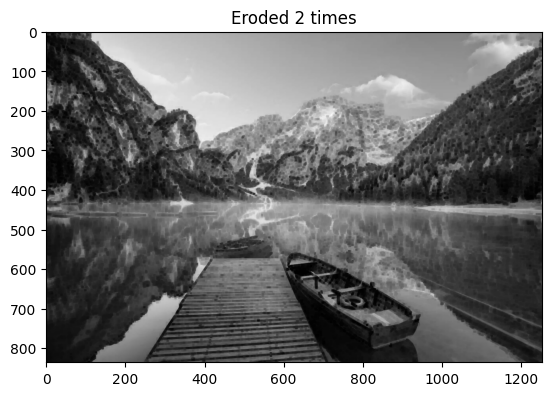

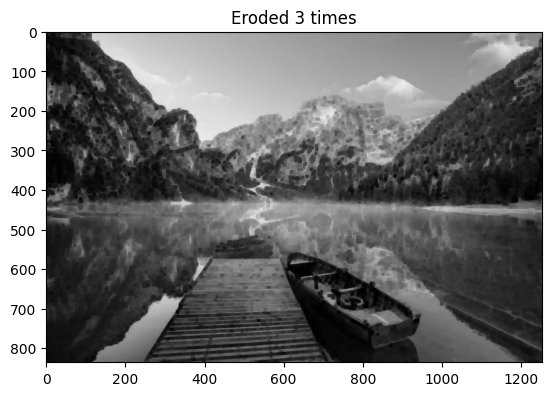

In [6]:
def plt_imshow(title, image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.show()

for i in range(0,3):
    eroded = cv2.erode(BGR2GRAY.copy(), None, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

### Binarize Image

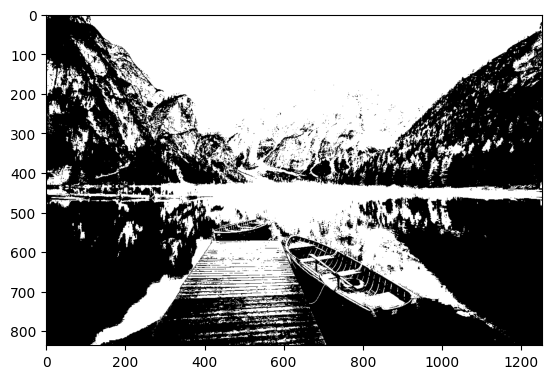

In [7]:
binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
image = cv2.cvtColor(binr, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

### We can Invert Image to keep foreground in white

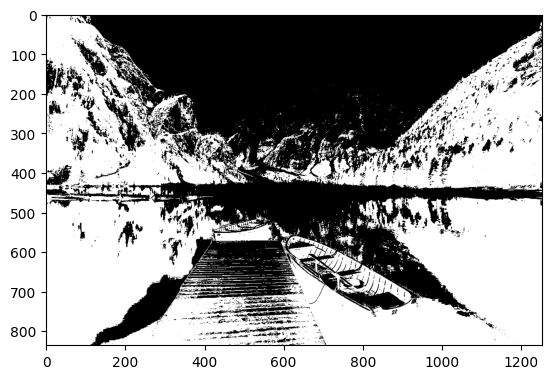

In [8]:
invert = cv2.bitwise_not(binr)
image = cv2.cvtColor(invert, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

Then, we can define a kernel of $5 \times 5$ to use in erosion

In [9]:
kernel = np.ones((5,5), np.uint8) #check for 3*3 or 7*7 kernel size too
print(kernel)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


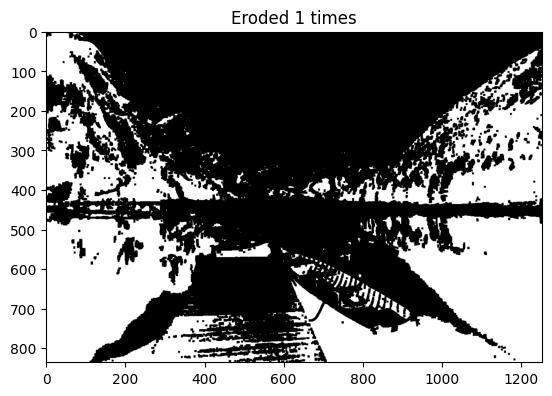

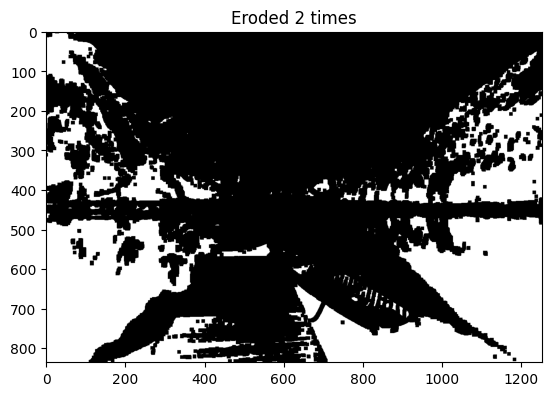

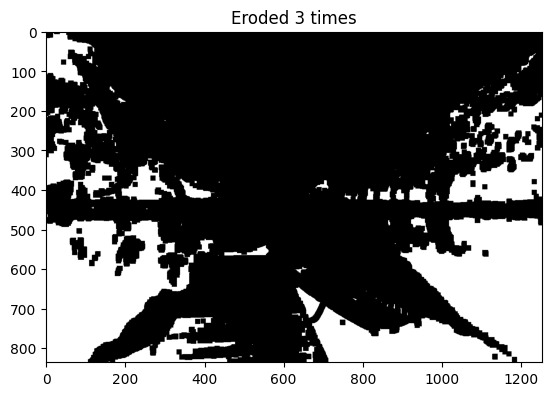

In [10]:
for i in range(0,3):
    eroded = cv2.erode(invert.copy(),kernel=kernel, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

## Dilation <a class="anchor" id="dilation" ></a>

Involves dilating outer surface (foreground) of image
- For joining broken parts of an image together

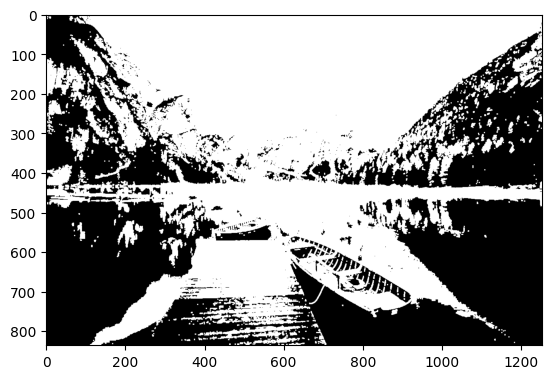

In [11]:
#binarize image
binr = cv2.threshold(BGR2GRAY,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
kernel = np.ones((3,3),np.uint8)
invert = cv2.bitwise_not(binr)

#dilate image
dilation = cv2.dilate(binr, kernel, iterations=1)

plt.imshow(dilation, cmap='gray')
plt.show()

We can apply series of dilations on inverted image using no kernel


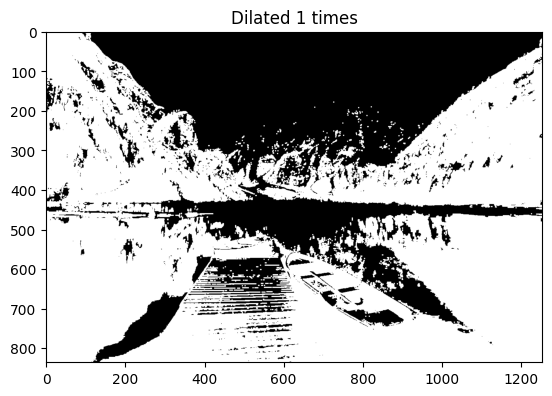

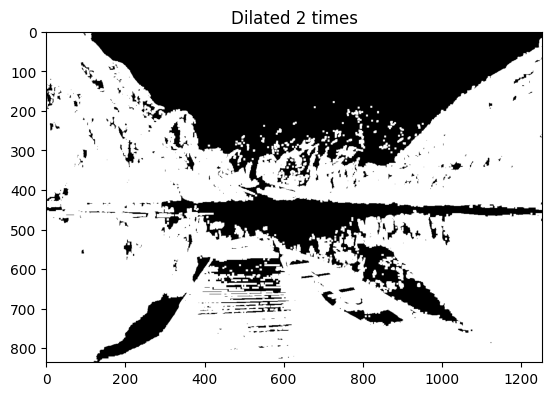

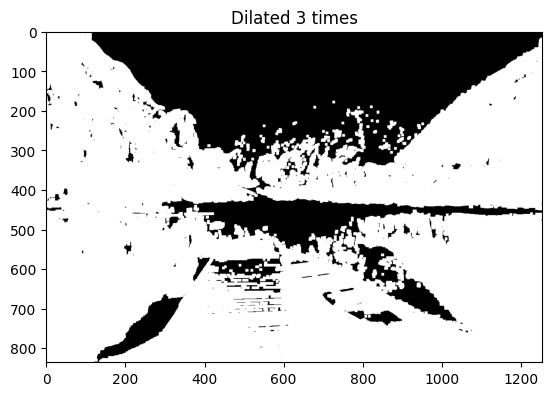

In [12]:
for i in range(0,3):
    dilated = cv2.dilate(invert.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

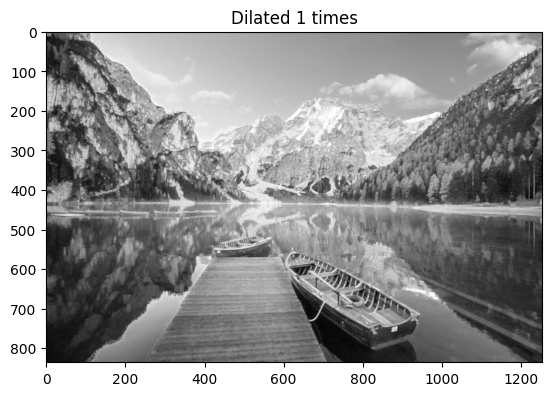

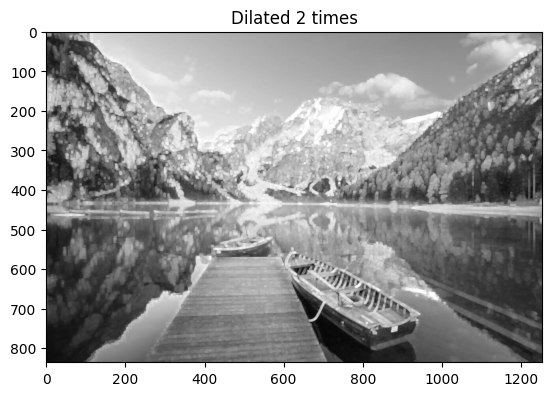

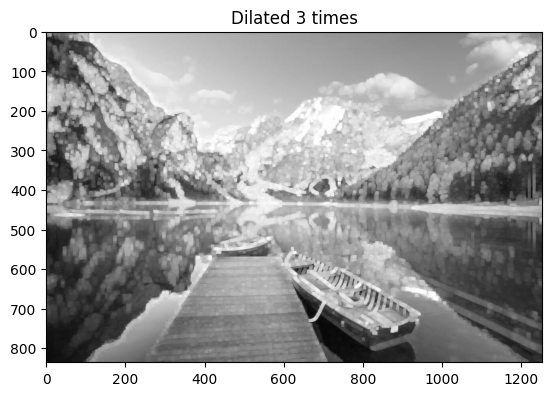

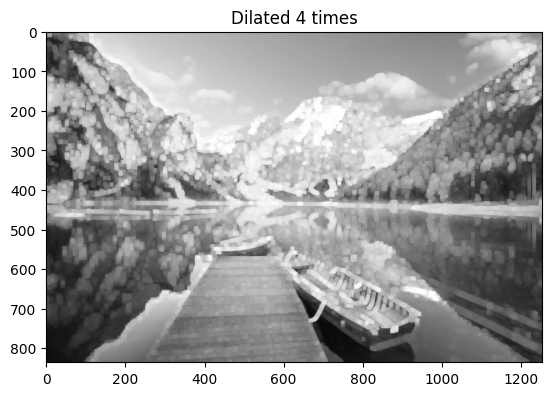

In [13]:
for i in range(0,4):
    dilated = cv2.dilate(BGR2GRAY.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

## Opening <a class="anchor" id="opening" ></a>

Erosion followed by dilation in outer surface (foreground) of image
- Generally used to remove noise (small blobs) in image


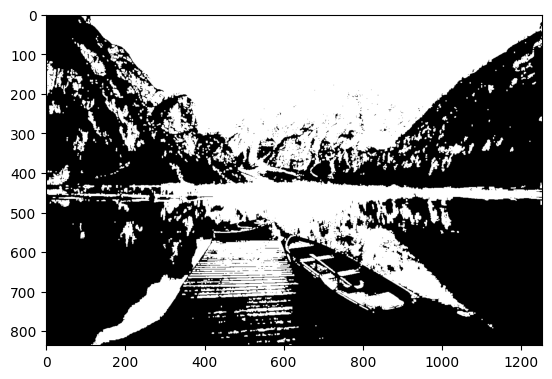

In [14]:
#opening image
opening = cv2.morphologyEx(binr,cv2.MORPH_OPEN,kernel,iterations=1)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

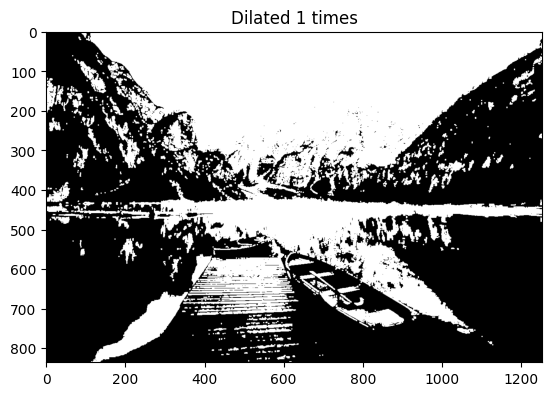

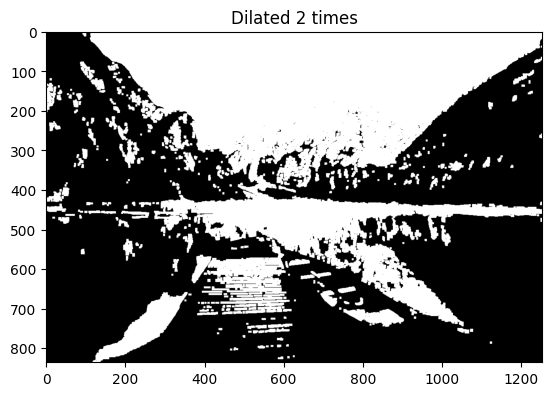

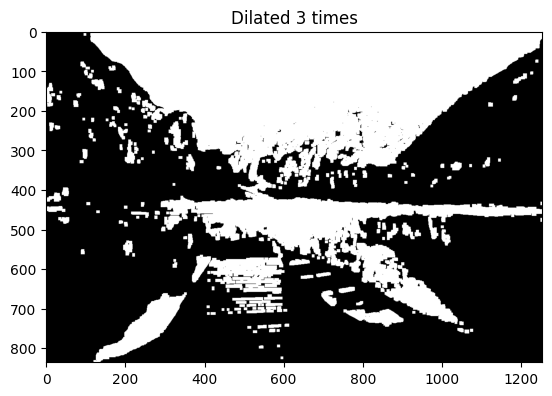

In [15]:
for i in range(0,3):
    opening = cv2.morphologyEx(binr.copy(),cv2.MORPH_OPEN,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),opening)
    plt.show()

## Closing <a class="anchor" id="closing" ></a>

Dilation followed by erosion in outer surface (foreground) of image
- Generally used to close holes inside of objects or for connecting components together

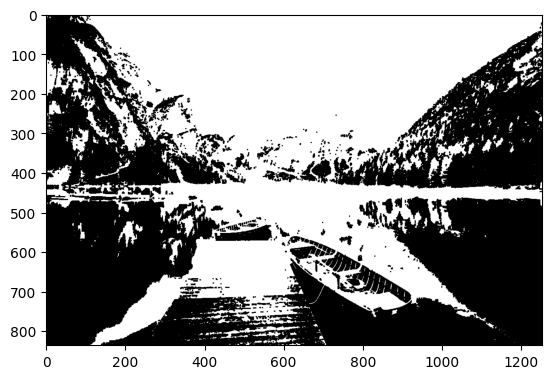

In [16]:
#closing image
closing = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel, iterations=1)

#print output
plt.imshow(closing,cmap='gray')
plt.show()

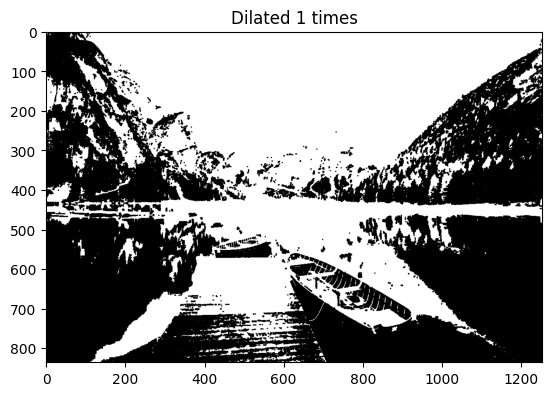

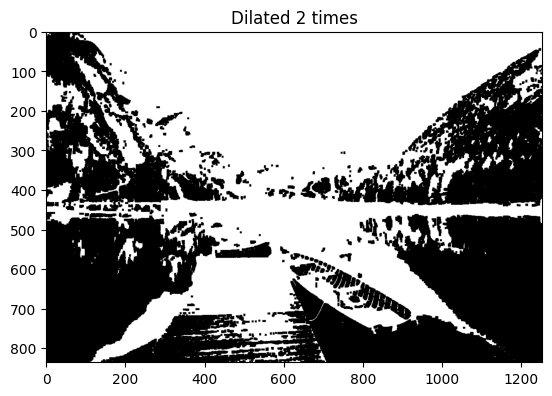

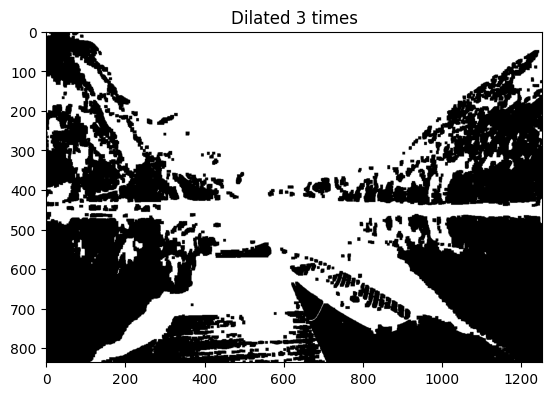

In [17]:
for i in range(0,3):
    closing = cv2.morphologyEx(binr.copy(),cv2.MORPH_CLOSE,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),closing)
    plt.show()

Iterating with different kernels

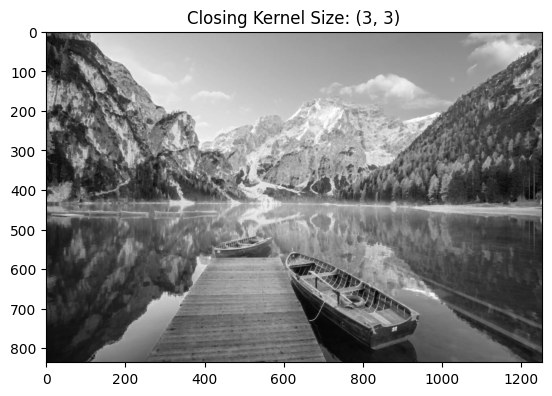

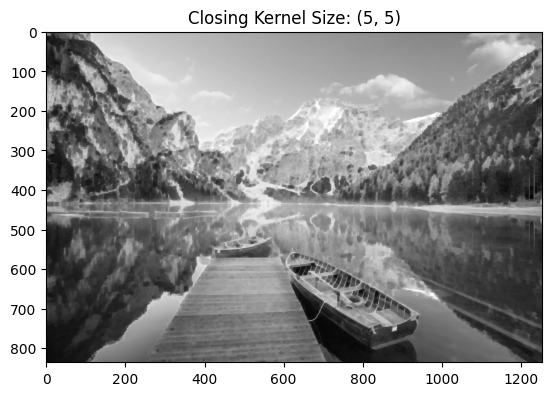

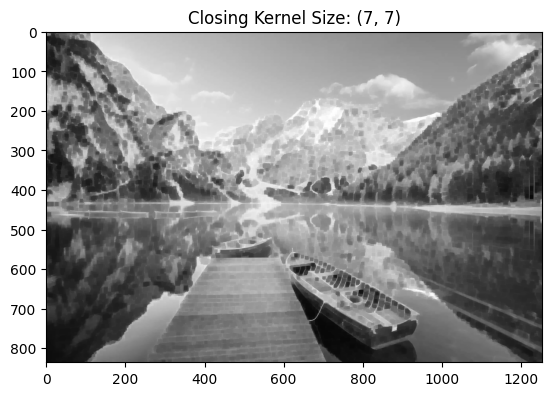

In [18]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    closing = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_CLOSE, kernel)
    plt_imshow("Closing Kernel Size: ({}, {})".format(kernelSize[0], kernelSize[1]), closing)

## Morphological Gradient <a class="anchor" id="gradient" ></a>

It first applies erosion and dilation individually on image and then computes difference between eroded and dilated image

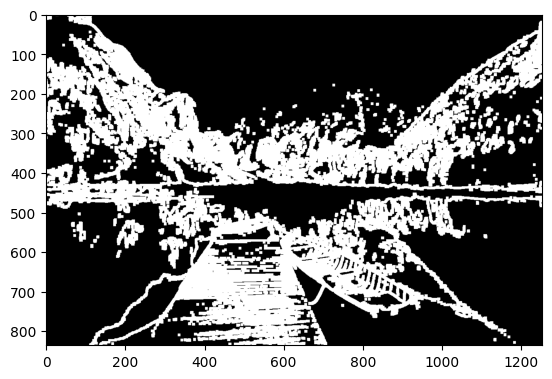

In [19]:
# use morph gradient
morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel)

#print output
plt.imshow(morph_gradient, cmap='gray')
plt.show()

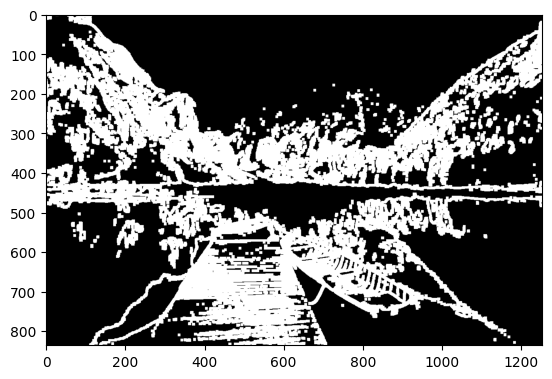

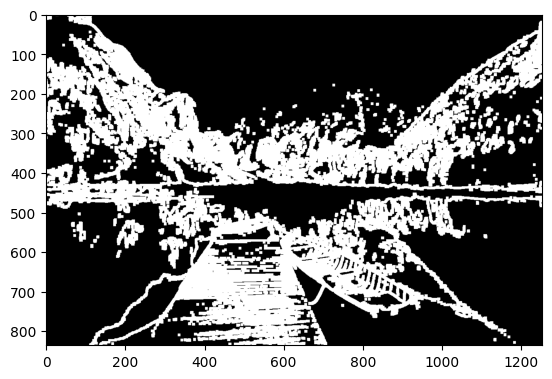

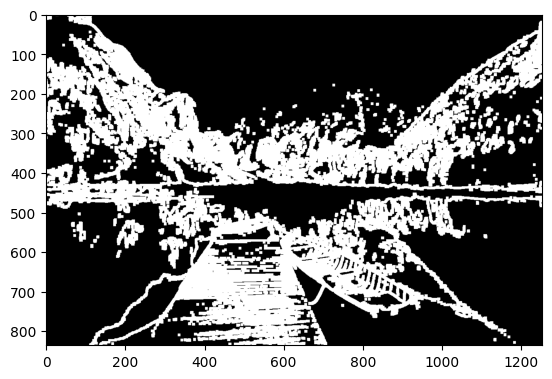

In [20]:
for i in range(0,3):
    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel+i)
    #print output
    plt.imshow(morph_gradient, cmap='gray')
    plt.show()

Iterating with different kernels

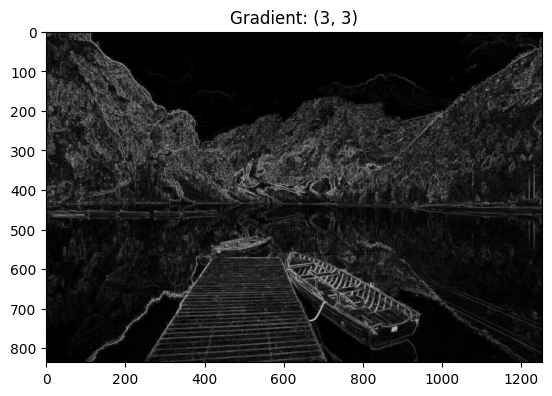

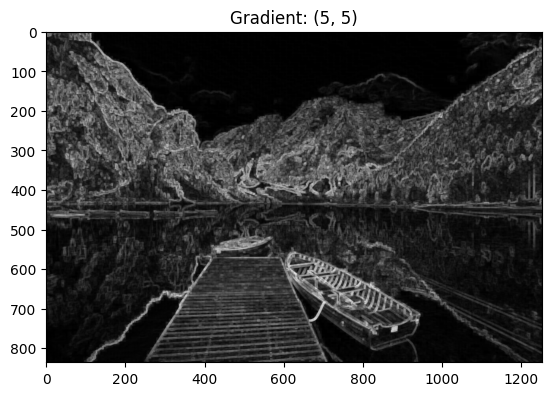

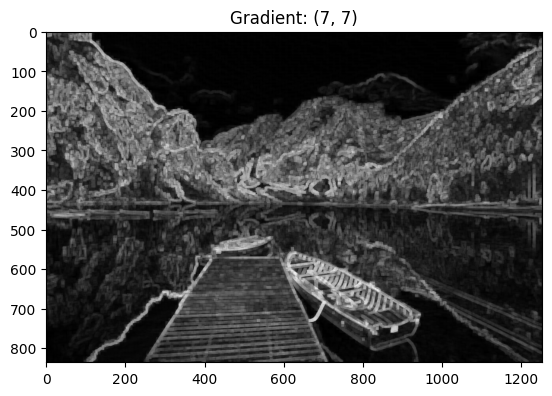

In [21]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    gradient = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_GRADIENT, kernel)
    plt_imshow("Gradient: ({}, {})".format(
        kernelSize[0], kernelSize[1]), gradient)

## Morphological Hats <a class="anchor" id="hats" ></a>

1. Top or White Hat
2. Black hat

### Top or White Hat <a class="anchor" id="top" ></a>

It is the difference between original (grayscale/single channel) input image and opening image

- Finds light(bright) regions of an image on dark background


In [22]:
#construct a kernel (13x5)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(13,5))
kernel

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

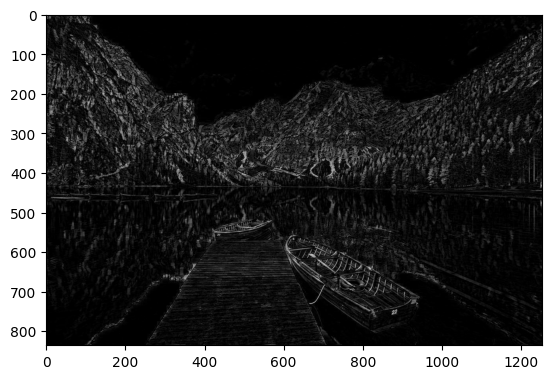

In [23]:
tophat = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_TOPHAT, kernel)

plt.imshow(tophat, cmap='gray')
plt.show()

### Black Hat <a class="anchor" id="black" ></a>

Output is a difference between input image & opened image
- Finds dark regions on a light background


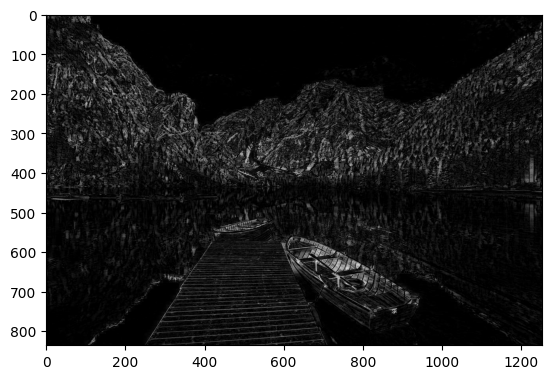

In [24]:
blackhat = cv2.morphologyEx(BGR2GRAY,cv2.MORPH_BLACKHAT,kernel)

plt.imshow(blackhat, cmap='gray')
plt.show()

# Ejercicio 1: Investigar una aplicación de erosión en procesamiento de imágenes e implementarlo en Colab

# **Erosión en Procesamiento de Imágenes**

La **erosión** es una operación morfológica fundamental en procesamiento de imágenes, utilizada principalmente para reducir el tamaño de los objetos en una imagen binaria o para eliminar pequeñas imperfecciones. Forma parte de las transformaciones morfológicas, que aplican un elemento estructurante para modificar la forma de las regiones de interés.

---

## **Definición**

La erosión consiste en reducir las regiones blancas (valor 1) de una imagen binaria en función de la forma y el tamaño de un elemento estructurante. Básicamente, **"erosiona" los bordes de las regiones blancas** al comparar los píxeles con el elemento estructurante.

---

## **Fórmula Matemática**

Sea \( $A$ \) un conjunto que representa los píxeles blancos en la imagen y \( $B$ \) el elemento estructurante, la erosión de \( $A$ \) por \( $B$ \) se define como:


$$A \ominus B = \{ z \in \mathbb{Z}^2 \mid (B)_z \subseteq A$$ \


Donde:
- \( $A$ \): Conjunto de coordenadas de píxeles en la región blanca (valor 1) de la imagen.
- \( $B$ \): Elemento estructurante, un conjunto de coordenadas que define la forma de la operación.
- \( $(B)_z$ \): Traslación del elemento estructurante \( $B$ \) al punto \( z \).

El píxel central de la región afectada se mantiene en valor 1 **solo si todos los píxeles cubiertos por el elemento estructurante también son 1**; en caso contrario, se asigna 0.

---

## **Usos de la Erosión**

1. **Eliminación de ruido:**
   - Se eliminan píxeles aislados o pequeñas irregularidades blancas que no se ajustan al tamaño del elemento estructurante.

2. **Reducción de objetos:**
   - Se reduce el tamaño de los objetos blancos en la imagen, útil para resaltar estructuras internas.

3. **Separación de objetos conectados:**
   - Divide objetos que están ligeramente conectados al eliminar puentes estrechos entre ellos.

4. **Preprocesamiento:**
   - Antes de operaciones como segmentación o detección de bordes, la erosión simplifica la forma de los objetos.




### Uso de la erosión para analísar el área afectada por la inundación del rio Indo.

En el siguiente ejercicio se usa la `erosion` para poder realizar un analísis del impacto de la inundación del rio Indo en la provincia de **Sind** en **Pakistán** en 2022.

[Noticia inundación Pakistán](https://actualidad.rt.com/actualidad/440246-fotos-nasa-inundaciones-pakistan-lago)

Las imagenes que se analisan son antes y después de la inundación.


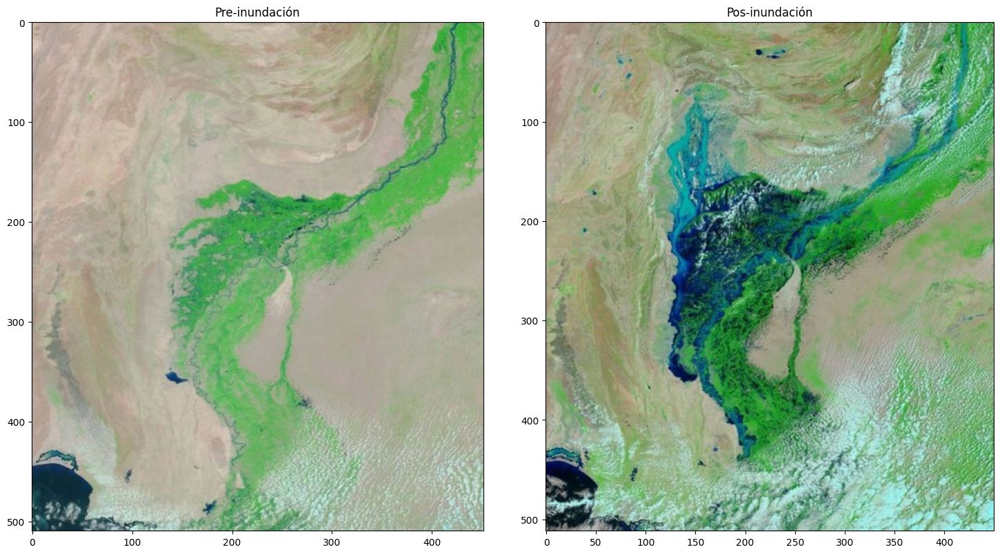

In [25]:
# Importar las imágenes
image1 = io.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/rio_indo1.jpg')
image2 = io.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/rio_indo2.jpg')

# Crear la figura y los subplots (grid 1x2)
fig, axes = plt.subplots(1, 2, figsize=(15, 8)) # 1 fila, 2 columnas

# Mostrar la primera imagen en el primer subplot
axes[0].imshow(image1)
axes[0].set_title("Pre-inundación") # Añade un título

# Mostrar la segunda imagen en el segundo subplot
axes[1].imshow(image2)
axes[1].set_title("Pos-inundación") # Añade un título

# Ajustar el espaciado entre subplots (opcional)
plt.tight_layout()

# Mostrar el grid de imágenes
plt.show()

En este ejercicio queremos medir el áraa total de la afectación de la inundación y saber en cuanto aumento el nivel del rio. Para esto utilizaremos el método de erosion para comparar las áreas totales y aprovechar para eliminar ruidos y separar bordes del caudal del río

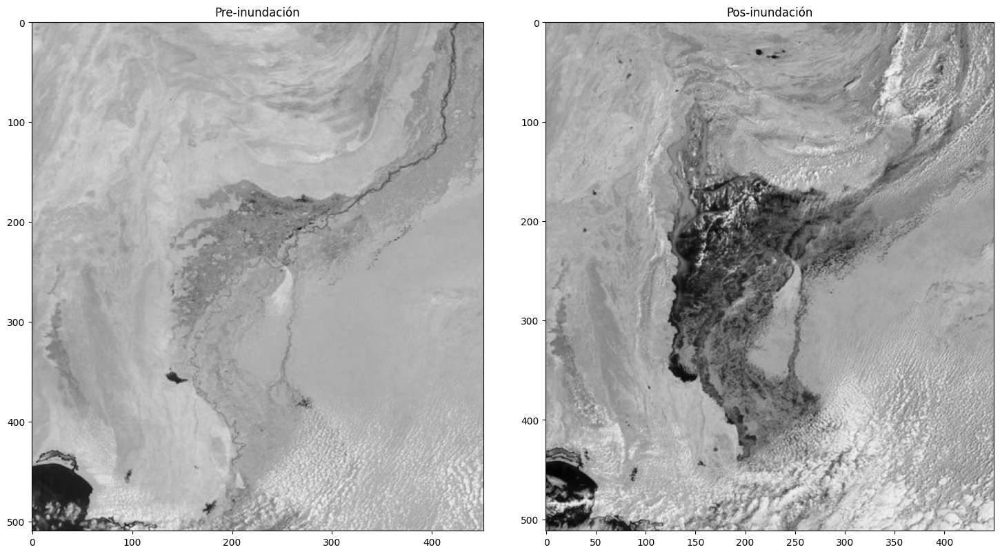

In [26]:
# Convertir a Escala de Grises las imagenes
img_gray1 = color.rgb2gray(image1)
img_gray2 = color.rgb2gray(image2)

# Crear la figura y los subplots (grid 1x2)
fig, axes = plt.subplots(1, 2, figsize=(15, 8)) # 1 fila, 2 columnas

# Mostrar la primera imagen en el primer subplot
axes[0].imshow(img_gray1, cmap="gray")
axes[0].set_title("Pre-inundación") # Añade un título

# Mostrar la segunda imagen en el segundo subplot
axes[1].imshow(img_gray2, cmap="gray")
axes[1].set_title("Pos-inundación") # Añade un título

# Ajustar el espaciado entre subplots (opcional)
plt.tight_layout()

Las imagenes hasta este punto no son muy claras pues hay mucho ruido que interfiere como las nueves o las áreas pantanosas aledañas al río.

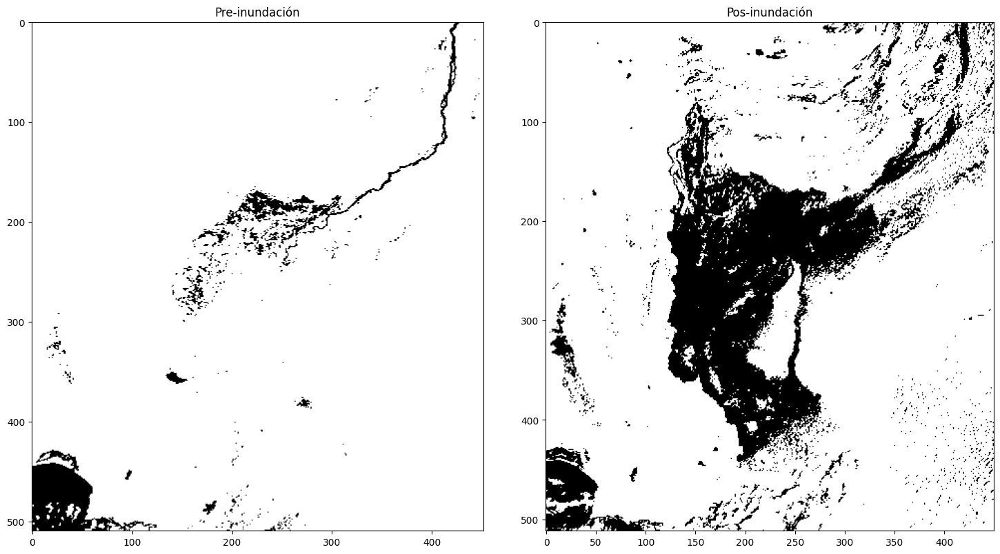

In [27]:
# Binarizamos nuestra imagen
ret1 ,thresh1 = cv2.threshold(img_gray1,0.5,255,cv2.THRESH_BINARY)
img_bin1 = thresh1.copy()

ret2 ,thresh2 = cv2.threshold(img_gray2,0.5,255,cv2.THRESH_BINARY)
img_bin2 = thresh2.copy()


# Crear la figura y los subplots (grid 1x2)
fig, axes = plt.subplots(1, 2, figsize=(15, 8)) # 1 fila, 2 columnas

# Mostrar la primera imagen en el primer subplot
axes[0].imshow(img_bin1, cmap="gray")
axes[0].set_title("Pre-inundación") # Añade un título

# Mostrar la segunda imagen en el segundo subplot
axes[1].imshow(img_bin2, cmap="gray")
axes[1].set_title("Pos-inundación") # Añade un título

# Ajustar el espaciado entre subplots (opcional)
plt.tight_layout()

El área de los caudales de los rios y la inundación ahora luce mucho más clara. Se procede a realizar la erosión para denotar los bordes de las áreas inundadas y el cause natural.

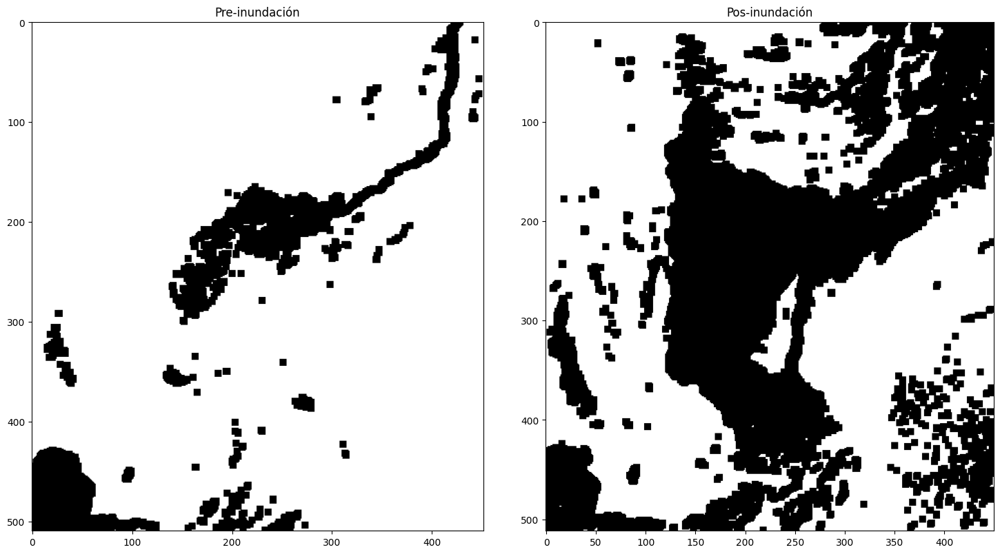

In [28]:
#Erosión

kern_size=3 # Tamaño del kernel
e_iterations=3 # Número de iteraciones

kernel_erosion = np.ones((kern_size,kern_size), np.uint8) #array del kernel
# Iteracion de eroeiones sobre las imagenes.
img_erosion1 = cv2.erode(img_bin1,kernel_erosion, iterations=e_iterations)
img_erosion2 = cv2.erode(img_bin2,kernel_erosion, iterations=e_iterations)


# Crear la figura y los subplots (grid 1x2)
fig, axes = plt.subplots(1, 2, figsize=(15, 8)) # 1 fila, 2 columnas

# Mostrar la primera imagen en el primer subplot
axes[0].imshow(img_erosion1, cmap="gray")
axes[0].set_title("Pre-inundación") # Añade un título

# Mostrar la segunda imagen en el segundo subplot
axes[1].imshow(img_erosion2, cmap="gray")
axes[1].set_title("Pos-inundación") # Añade un título

# Ajustar el espaciado entre subplots (opcional)
plt.tight_layout()

### Conclusión:
Con esta operación hemos eliminado el ruido externo que existia en la imagén, así como separar los objetos aparentemente conectados.

Ahora se alcanza a apreciar perfectamente cual era el estado del caudal del río antes y el nuevo caudal después de la inundación, resaltando el cambio en las áreas impactadas.

Como extra utilizaremos una operación básica vista en los notebooks anteriores que es la sustracción de imagenes para hacer una comparación en el cambio del caudal original.

Como las imagenes tienen diferente definición generamos un código para adaptarlas a la misma resolución:

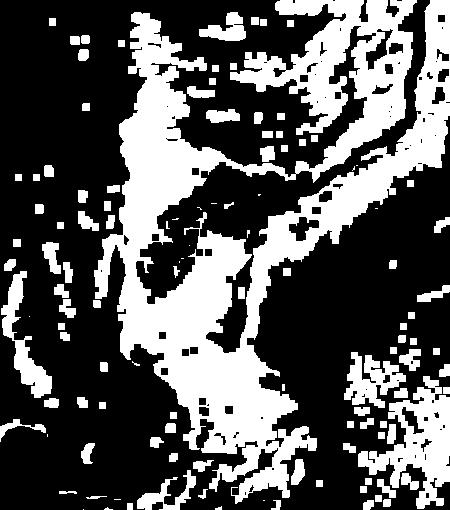

In [29]:
# Imagenes a modificar el tamañl
img1 = img_erosion1
img2 = img_erosion2

if img1 is None or img2 is None:
    print("Error: No se pudieron cargar las imágenes.")
else:
    # 1. Comprobar y redimensionar
    h1, w1 = img1.shape[:2]  # Obtiene alto y ancho de img1
    h2, w2 = img2.shape[:2]  # Obtiene alto y ancho de img2

    if h1 != h2 or w1 != w2:  # Si las dimensiones son diferentes
        min_h = min(h1, h2)  # Encuentra el alto mínimo
        min_w = min(w1, w2)  # Encuentra el ancho mínimo

        img1_resized = cv2.resize(img1, (min_w, min_h), interpolation=cv2.INTER_AREA) # Redimensiona img1
        img2_resized = cv2.resize(img2, (min_w, min_h), interpolation=cv2.INTER_AREA) # Redimensiona img2

        img_bin1 = img1_resized #Usamos las imagenes redimensionadas
        img_bin2 = img2_resized #Usamos las imagenes redimensionadas
    else:
        img_bin1 = img1 #Si no hay que redimensionar, usamos las originales
        img_bin2 = img2 #Si no hay que redimensionar, usamos las originales

    # 2. Asegurar que sean binarias (0 o 255)
    # Esto es especialmente importante si has aplicado operaciones como umbralizado.
    _, img_bin1 = cv2.threshold(img_bin1, 127, 255, cv2.THRESH_BINARY)
    _, img_bin2 = cv2.threshold(img_bin2, 127, 255, cv2.THRESH_BINARY)

    # Sustracción de las imagenes
    img_sust = cv2.subtract(img_bin1, img_bin2)

    # Despliegue de las imagenes
    cv2_imshow(img_sust)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


En esta nueva imagen generada de la erosión y sustracción de ambas imagenes podemos ver en color blanco el cambio del nivel del agua en el rio Indo. En el centro de la mancha blanca podemos ver en color negro el cause original por lo que ahora se puede medir el impacto real del incremento del caudal después de la inundación.

## Referencias:
Referencias


* rubenchov. (2020, November 19). Erosión y dilatación (python y opencv). YouTube. Retrieved February 4, 2023, from https://www.youtube.com/watch?v=R8Q3ZdDf5xs
* Sosa-Costa, A. (2021, January 4). Transformaciones morfológicas. ▷ Cursos de Programación de 0 a Experto © Garantizados. Retrieved February 4, 2023, from https://unipython.com/transformaciones-morfologicas/

# Ejercicio 2: Investigar una aplicación de dilatación en procesamiento de imágenes e implementarlo en Colab

# **Dilatación en Procesamiento Morfológico de Imágenes**

La **dilatación** es una operación fundamental en el procesamiento morfológico de imágenes que se utiliza para expandir las regiones blancas (o brillantes) en una imagen binaria. Esta operación agranda los objetos presentes en la imagen y puede "cerrar" pequeños agujeros o discontinuidades en las estructuras.

---

## **Definición**

En términos simples, la dilatación agrega píxeles a los bordes de los objetos en una imagen binaria. La cantidad y forma en que los objetos se expanden dependen de un elemento estructurante predefinido, el cual define el vecindario alrededor de cada píxel.

La dilatación es particularmente útil para:

- Conectar componentes desconectados.
- Rellenar pequeños agujeros en las regiones blancas.
- Realzar detalles importantes en las imágenes.

---

## **Fórmula Matemática**

Sea \( $A$ \) una imagen binaria y \( $B$ \) un **elemento estructurante**, la dilatación de \( $A$ \) por \( $B$ \) se define como:


$A \oplus B = \{ z \in \mathbb{Z}^2 \mid (B)_z \cap A \neq \emptyset$ \}


Donde:

- \( $A$ \): Conjunto de píxeles pertenecientes a los objetos (regiones blancas).
- \( $B$ \): Elemento estructurante, que define la forma y el tamaño de la dilatación.
- \( $(B)_z$ \): Traslación del elemento estructurante \( $B$ \) al punto \( z \).
- \( $\cap$ \): Representa la intersección entre \( $B$ \) y los píxeles de \( $A$ \).

En palabras simples, el píxel central de \( $A$ \) se activa (se vuelve blanco) si al menos un píxel del elemento estructurante \( $B$ \) coincide con un píxel blanco de \( $A$ \).

---

## **Proceso de Dilatación**

1. Se posiciona el **elemento estructurante** \( $B$ \) sobre cada píxel de la imagen.
2. Si al menos un píxel del elemento estructurante \( $B$ \) coincide con un píxel blanco en \( $A$ \), el píxel central de la vecindad se vuelve blanco.
3. Este proceso se repite para todos los píxeles de la imagen.


## **Principales usos de la dilatación**

1. **Expandir objetos**  
   - La dilatación aumenta el tamaño de las regiones de primer plano (píxeles blancos). Es útil para agrandar características importantes de los objetos en una imagen.

2. **Cerrar pequeños huecos**  
   - Ayuda a rellenar huecos pequeños o discontinuidades en los objetos, como agujeros en figuras o interrupciones en bordes.

3. **Conectar componentes cercanos**  
   - La dilatación puede conectar objetos que están próximos entre sí, formando una única región continua si están dentro de la distancia definida por el elemento estructurante.

4. **Enfatizar bordes exteriores**  
   - Resalta y refuerza los contornos exteriores de los objetos, incrementando la visibilidad de las características externas.

5. **Preprocesamiento para análisis de características**  
   - Se usa como un paso previo para operaciones más complejas, como la extracción de bordes o la segmentación de imágenes.

6. **Corrección de defectos pequeños**  
   - Permite eliminar imperfecciones menores en las imágenes binarias, como eliminar depresiones en los bordes de un objeto.

7. **Preparación para combinaciones con otras operaciones morfológicas**  
   - En combinación con la erosión (*closing*, *opening*), la dilatación contribuye a operaciones más avanzadas, como el cierre de brechas en líneas o la eliminación de ruido.

8. **Procesamiento de texto en imágenes**  
   - Ayuda a conectar caracteres fragmentados en el reconocimiento de texto (OCR, por sus siglas en inglés), uniendo trazos interrumpidos.

9. **Realce de elementos estructurales**  
   - Útil para resaltar y analizar patrones o estructuras específicas dentro de la imagen, especialmente en aplicaciones médicas (como la identificación de tejidos) o industriales.





In [30]:
# Generamos una función que usaremos en un bucle para imprimir la dilatación.
def plt_imshow(title, image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.show()

## Dilatación para detectar celulas con leucemia.

# ¿Qué es la leucemia y cómo afecta a las células?

La leucemia es un tipo de cáncer que afecta a la médula ósea, el tejido donde se producen las células sanguíneas. Se caracteriza por la producción anormal y descontrolada de glóbulos blancos inmaduros (llamados blastos), que no funcionan correctamente y se acumulan en la sangre, interfiriendo con el equilibrio normal de las células sanguíneas.

## ¿Cómo afecta la leucemia a las células?

1. **Afecta a los glóbulos blancos**  
   - Los glóbulos blancos anormales no cumplen su función de combatir infecciones, debilitando el sistema inmunológico.

2. **Disminuye los glóbulos rojos**  
   - La acumulación de blastos en la médula ósea reduce la producción de glóbulos rojos, lo que causa anemia y fatiga.

En resumen, la leucemia altera el equilibrio normal de las células sanguíneas, comprometiendo funciones vitales del cuerpo como la oxigenación, la coagulación y la inmunidad.


En la siguiente imagen tenemos una muestra sanguinea que presenta ceculas sanguineas sanas e infectadas (Inmaduras)

Nuestro objetivo es por medio de la dilatación poder resaltar aquellas celulas para su fácil detección, reparando en la imagen aquellos espacios en blanco o irreconocibles.

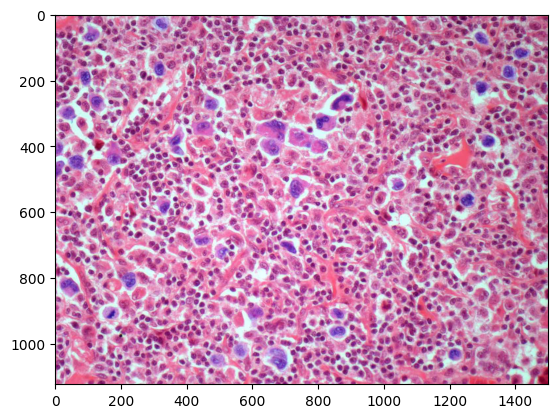

In [31]:
# Importamos la imagen de leucemia y la imprimimos
img = cv2.imread("/content/drive/MyDrive/VisionComp_Imagenes/data/cancer2.jpg")
img7 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img7)
plt.show()

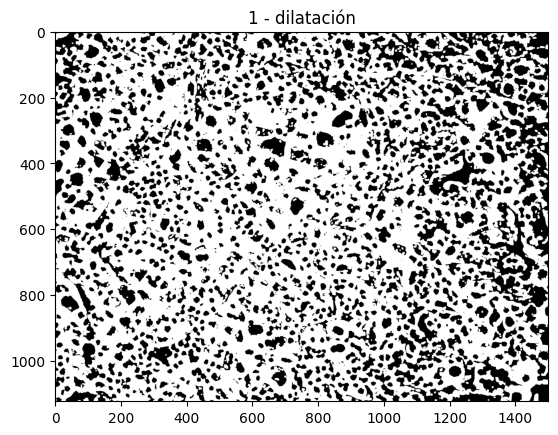

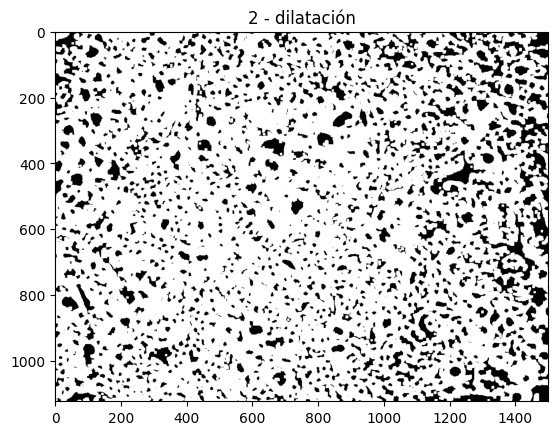

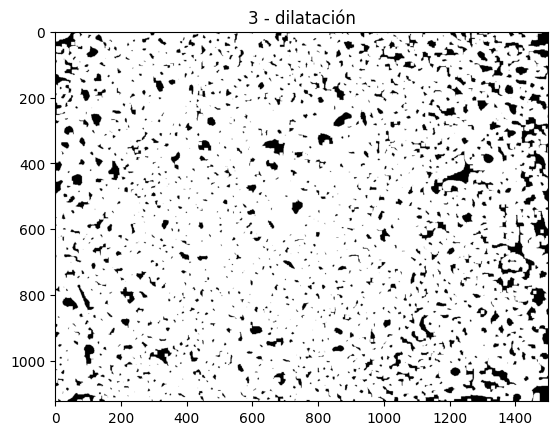

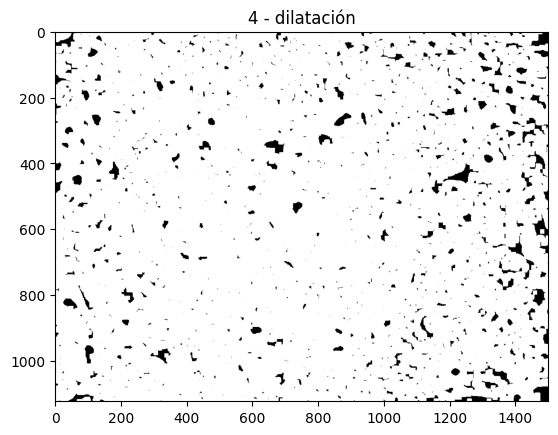

In [32]:
# Ponemos la imagen en escala de grises
img7 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Binarizamos la imagen
mask = cv2.threshold(img7,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

kern_size=4 # Tamaño del kernel
e_iterations=4 # Número de iteraciones

kernel = np.ones((kern_size,kern_size), np.uint8)

for i in range(0,e_iterations):
    # Ejecutamos un ciclo de diferentes iteraccion
    dilation = cv2.dilate(mask.copy(), kernel, iterations=i+1)
    plt_imshow("{} - dilatación".format(i+1), dilation)

plt.show()

### Conclusión:
En este ejemplo pudismos ver como la dilatación nos ayuda a resaltar caracteristicas y llenar bordes. En este caso lo que queriamos resaltar es aquellas celulas sanguineas inmaduras que eran las más grandes. Pero el resto de celuas hace un ruido y dificulta su visualización. Con forme realizamos diferentes iteraciones de dilatación podemos ver que se ven eliminando y nos quedamos con los bordes de aquellas celulas que nos interesan.

### Referencias:
* Towards Data Science. (n.d.). *Understanding morphological image processing and its operations*. Medium. Retrieved January 28, 2025, from https://towardsdatascience.com/understanding-morphological-image-processing-and-its-operations-7bcf1ed11756

* Analytics Vidhya. (n.d.). *Morphological transformations of images using OpenCV (Image Processing Part 2)*. Medium. Retrieved January 28, 2025, from https://medium.com/analytics-vidhya/morphological-transformations-of-images-using-opencv-image-processing-part-2-f64b14af2a38

* MedlinePlus. (n.d.). *Leucemia*. U.S. National Library of Medicine. Retrieved January 28, 2025, from https://medlineplus.gov/spanish/ency/article/001299.htm


# Ejercicio 3:  Investigar una aplicación de opening y closing e implementalo en Google Colab.

# Operaciones 'Opening' y 'Closing'

En el procesamiento de imágenes, las operaciones morfológicas *opening* y *closing* son técnicas fundamentales que utilizan un elemento estructurante para modificar la geometría de los objetos en una imagen binaria o en escala de grises. Estas operaciones son complementarias y tienen diferentes aplicaciones dependiendo de las necesidades de la tarea.

## Opening
- El *opening* (apertura) se realiza aplicando una **erosión** seguida de una **dilatación**.
- Se utiliza principalmente para eliminar ruido pequeño y desconectar objetos pequeños no deseados.
- Tiende a suavizar los contornos de los objetos y eliminar protuberancias o detalles pequeños.
- Mantiene la forma y tamaño general de los objetos más grandes.

## Closing
- El *closing* (cierre) se realiza aplicando una **dilatación** seguida de una **erosión**.
- Es útil para rellenar huecos pequeños dentro de los objetos y cerrar brechas estrechas entre ellos.
- Suaviza contornos y conecta componentes que están cercanos entre sí.
- Mantiene los detalles más prominentes de los objetos originales.

---

## Tabla comparativa de 'Opening' y 'Closing'

| **Aspecto**            | **Opening**                                            | **Closing**                                            |
|-------------------------|-------------------------------------------------------|-------------------------------------------------------|
| **Definición**          | Erosión seguida de dilatación                         | Dilatación seguida de erosión                         |
| **Propósito principal** | Eliminar ruido pequeño y detalles no deseados         | Rellenar huecos pequeños y cerrar brechas estrechas   |
| **Efecto en contornos** | Suaviza y elimina protuberancias                      | Suaviza y conecta componentes cercanos                |
| **Aplicaciones comunes**| Limpieza de ruido aislado, segmentación precisa       | Reconexión de partes cercanas, eliminación de huecos  |
| **Transformación**      | Reduce el tamaño de objetos pequeños o delgados      | Expande y conecta regiones separadas                 |
| **Complementariedad**   | Actúa como operación inversa a la dilatación          | Actúa como operación inversa a la erosión            |

---

Ambas operaciones son herramientas clave en el análisis y procesamiento de imágenes, y su combinación permite refinar estructuras en imágenes para una mejor segmentación y análisis morfológico.


## Analísis de huellas digítales con los métodos `Open` y  `Close`.

En este ejercicio aplicaremos ambos métodos para poder analizar huellas digitales. Y comparar como es que pueden ser de utilidad para resaltar las caracteristicas de estos.

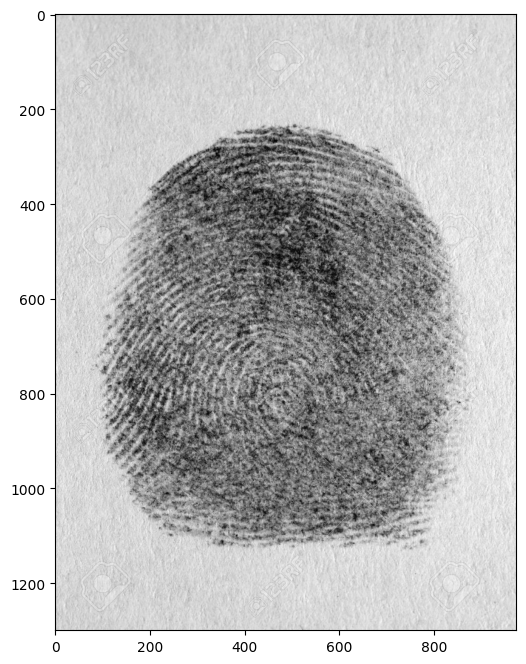

In [33]:
# Importamos la imagen
img_e3 = cv2.imread("/content/drive/MyDrive/VisionComp_Imagenes/data/fingerprint.jpg")

# Mostrar imagen
fig = plt.figure(figsize=(15,8))
plt.imshow(img_e3)

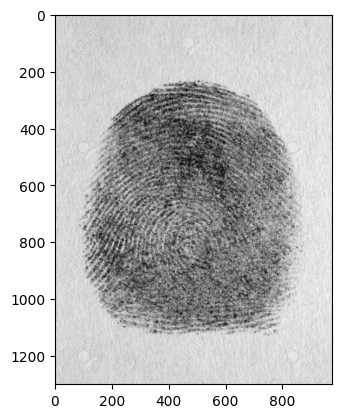

In [34]:
# Convertir a Escala de Grises
BGR2GRAY = cv2.cvtColor(img_e3,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

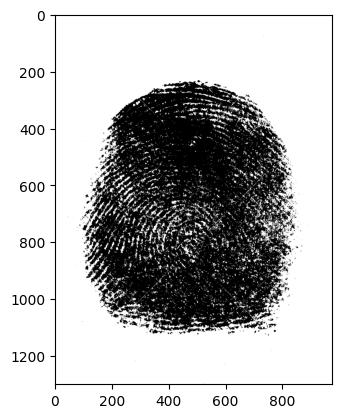

In [35]:
# Binarize image
binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
image = cv2.cvtColor(binr, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

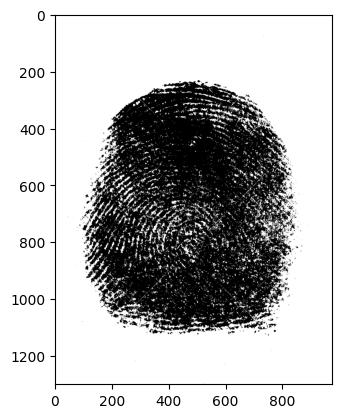

In [36]:
# Invert image to keep foreground in white
invert = cv2.bitwise_not(binr)
imag = cv2.cvtColor(invert, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

In [37]:
# Definir kernel a utilizar

kernel = np.ones((5,5), np.uint8) #check for 3*3 or 7*7 kernel size too
print(kernel)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


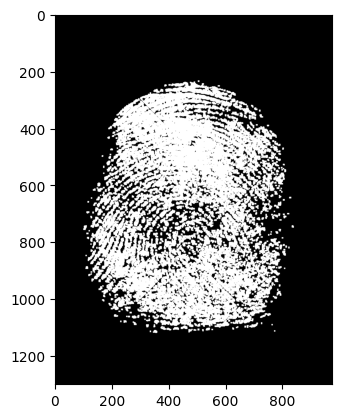

In [38]:
#opening image
opening = cv2.morphologyEx(invert,cv2.MORPH_OPEN,kernel,iterations=1)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

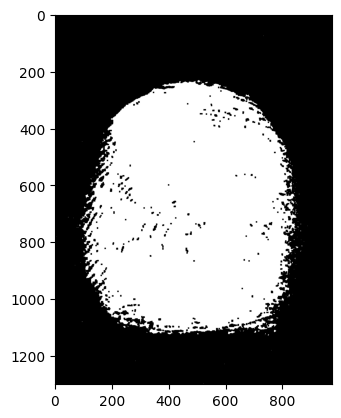

In [39]:
#closing image
closing = cv2.morphologyEx(invert, cv2.MORPH_CLOSE, kernel, iterations=1)

#print output
plt.imshow(closing,cmap='gray')
plt.show()

(1300, 974) (1300, 974) (1300, 974)


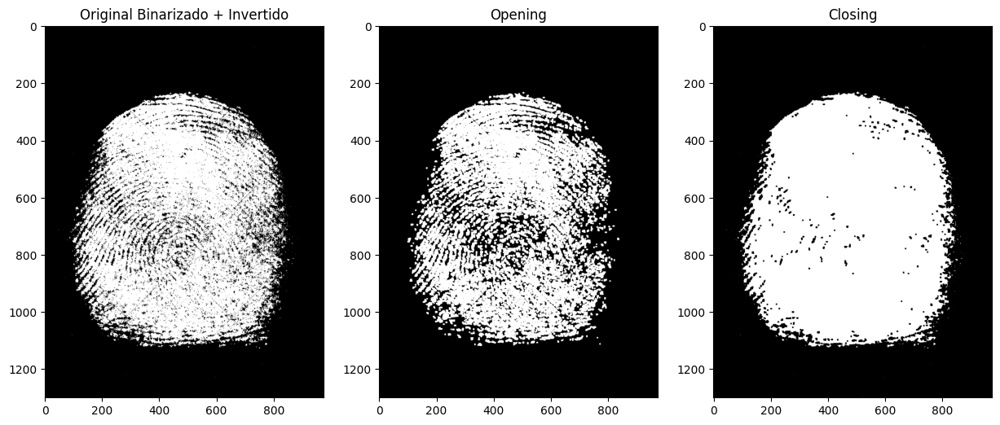

In [40]:
#function to see image
def imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3):
    print(img.shape,img1.shape,img2.shape)
    fig = plt.figure(figsize=(15,8))
    #adds a subplot at 1st position
    fig.add_subplot(rows,columns,1)
    plt.title('Original Binarizado + Invertido')
    plt.imshow(img, cmap="gray")

    #adds a subplot at 2nd position
    fig.add_subplot(rows,columns,2)
    plt.title('Opening')
    plt.imshow(img1,cmap="gray")

    #adds a subplot at 3rd position
    fig.add_subplot(rows,columns, 3)
    plt.title('Closing')
    plt.imshow(img2,cmap="gray")
    plt.show()

imgshow(img=invert,img1=opening,img2=closing, rows=1,columns=3)

### Conclusión:
En los resultados podemos observar las diferentes caracteristicas que aporta cada método

* **Open**: \
Al ser una erosión seguida de una dilatación este método nos permite perimero eliminar el ruido que hay en la imagen, para después resaltar los detalles de las huellas dactilares. En la imagen se observa que los detalles de las huellas estan mucho más resaltados y detallados que la imagen original

* **Close**: \
Al ser una dilatación seguida de una erosión el resultado nos da muy poca relevancia en las huellas digitales, pues al dilatar primero estas fueron resaltadas y erosión se encarga de elimar aquellas lineas de conecxión y resaltar la forma del dedo. Obtenemos una imagen más enfocada a la forma del dedo.

Ambos métodos cumplen diferentes funciones por lo que deben de ser utilizados en base al objetivo final buscado.

## Referencias:
* Towards Data Science. (n.d.). *Understanding morphological image processing and its operations*. Medium. Retrieved January 28, 2025, from https://towardsdatascience.com/understanding-morphological-image-processing-and-its-operations-7bcf1ed11756

* Analytics Vidhya. (n.d.). *Morphological transformations of images using OpenCV (Image Processing Part 2)*. Medium. Retrieved January 28, 2025, from https://medium.com/analytics-vidhya/morphological-transformations-of-images-using-opencv-image-processing-part-2-f64b14af2a38

* PyImageSearch. (2021, April 28). *OpenCV morphological operations*. PyImageSearch. Retrieved January 28, 2025, from https://pyimagesearch.com/2021/04/28/opencv-morphological-operations/


